In [89]:
import os
import re
import json
import pickle
from pathlib import Path
import yaml

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scanpy as sc
import scipy
import skimage
import pandas as pd
import torch
import tifffile
from einops import rearrange, repeat

In [2]:
import matplotlib as mpl
mpl.rcParams['pdf.fonttype'] = 42
plt.rcParams['svg.fonttype'] = 'none'

In [3]:
%load_ext autoreload

In [4]:
%autoreload 2

In [5]:
import mushroom.utils as utils
import mushroom.visualization.utils as vis_utils
import mushroom.data.datasets as datasets
import mushroom.data.visium as visium
import mushroom.data.xenium as xenium
import mushroom.data.multiplex as multiplex
import mushroom.data.he as he
import mushroom.registration.bigwarp as bigwarp
from mushroom.mushroom import Mushroom

In [6]:
project_dir = '/data/estorrs/mushroom/data/projects/submission_v1'
output_dir = os.path.join(project_dir, 'analysis', 'export')
Path(output_dir).mkdir(parents=True, exist_ok=True)

In [7]:
def alter_filesystem(config, source_root, target_root):
    for entry in config['sections']:
        for mapping in entry['data']:
            mapping['filepath'] = mapping['filepath'].replace(source_root, target_root)
    
    if 'trainer_kwargs' in config and config['trainer_kwargs']['data_mask'] is not None:
        config['trainer_kwargs']['data_mask'] = config['trainer_kwargs']['data_mask'].replace(source_root, target_root)
        
    return config

In [8]:
source_root = '/diskmnt/Projects/Users/estorrs/mushroom/data'
target_root = '/data/estorrs/mushroom/data'

In [141]:
# exclude = ['S18-25943-A7', 'C3L-00970', 'WD-76845']
exclude = ['WD-76845']

In [137]:
fps = sorted(utils.listfiles(project_dir, regex=r'mushroom_50res/config.yaml$'))
fps

['/data/estorrs/mushroom/data/projects/submission_v1/C3L-00970/mushroom_50res/config.yaml',
 '/data/estorrs/mushroom/data/projects/submission_v1/C3L-00982/mushroom_50res/config.yaml',
 '/data/estorrs/mushroom/data/projects/submission_v1/C3L-01287/mushroom_50res/config.yaml',
 '/data/estorrs/mushroom/data/projects/submission_v1/C3L-02551/mushroom_50res/config.yaml',
 '/data/estorrs/mushroom/data/projects/submission_v1/HT206B1/mushroom_50res/config.yaml',
 '/data/estorrs/mushroom/data/projects/submission_v1/HT225C1/mushroom_50res/config.yaml',
 '/data/estorrs/mushroom/data/projects/submission_v1/HT268B1/mushroom_50res/config.yaml',
 '/data/estorrs/mushroom/data/projects/submission_v1/HT339B2-H1/mushroom_50res/config.yaml',
 '/data/estorrs/mushroom/data/projects/submission_v1/HT397B1/mushroom_50res/config.yaml',
 '/data/estorrs/mushroom/data/projects/submission_v1/HT413C1-K2/mushroom_50res/config.yaml',
 '/data/estorrs/mushroom/data/projects/submission_v1/HT413C1-Th1k4A1/mushroom_50res/co

In [142]:
case_to_sections = {fp.split('/')[-3]:yaml.safe_load(open(fp))['sections'] for fp in fps}
case_to_sections = {k:v for k, v in case_to_sections.items() if k not in exclude}
case_to_sections.keys()

dict_keys(['C3L-00970', 'C3L-00982', 'C3L-01287', 'C3L-02551', 'HT206B1', 'HT225C1', 'HT268B1', 'HT339B2-H1', 'HT397B1', 'HT413C1-K2', 'HT413C1-Th1k4A1', 'HT448C1-Th1K1Fp1', 'HT553P1-H2', 'HT565B1-H2', 'S18-25943-A7', 'S18-5591-C8', 'S18-9906', 'P21_F2RM6R'])

In [169]:
case = 'HT206B1'
# case = 'S18-5591-C8'
# case = 'S18-9906'
# case = 'HT413C1-Th1k4A1'
# case = 'C3L-00982'
# case = 'C3L-02551'
# case = 'C3L-00970'
# case = 'C3L-01287'

In [170]:
sections = case_to_sections[case]
sections

[{'data': [{'dtype': 'xenium',
    'filepath': '/data/estorrs/mushroom/data/projects/submission_v1/HT206B1/registered/s0_HT206B1-U1_xenium.h5ad'}],
  'position': 0,
  'sid': 'HT206B1-U1'},
 {'data': [{'dtype': 'multiplex',
    'filepath': '/data/estorrs/mushroom/data/projects/submission_v1/HT206B1/registered/s1_HT206B1-U2_multiplex.ome.tiff'}],
  'position': 5,
  'sid': 'HT206B1-U2'},
 {'data': [{'dtype': 'he',
    'filepath': '/data/estorrs/mushroom/data/projects/submission_v1/HT206B1/registered/s2_HT206B1-U4_he.tif'}],
  'position': 15,
  'sid': 'HT206B1-U4'},
 {'data': [{'dtype': 'multiplex',
    'filepath': '/data/estorrs/mushroom/data/projects/submission_v1/HT206B1/registered/s3_HT206B1-U5_multiplex.ome.tiff'}],
  'position': 20,
  'sid': 'HT206B1-U5'},
 {'data': [{'dtype': 'xenium',
    'filepath': '/data/estorrs/mushroom/data/projects/submission_v1/HT206B1/registered/s4_HT206B1-U8_xenium.h5ad'}],
  'position': 40,
  'sid': 'HT206B1-U8'},
 {'data': [{'dtype': 'xenium',
    'filep

In [171]:
dtype_to_volume = pickle.load(
    open(os.path.join(project_dir, case, 'mushroom_50res', f'nbhd_volumes_l2.pkl'), 'rb')
)['labeled']

outputs = pickle.load(
    open(os.path.join(project_dir, case, 'mushroom_50res', f'outputs.pkl'), 'rb')
)
section_ids = outputs['section_ids']
section_positions = outputs['section_positions']
section_ids, section_positions

([('HT206B1-U1', 'xenium'),
  ('HT206B1-U2', 'multiplex'),
  ('HT206B1-U4', 'he'),
  ('HT206B1-U5', 'multiplex'),
  ('HT206B1-U8', 'xenium'),
  ('HT206B1-U9', 'xenium'),
  ('HT206B1-U10', 'multiplex'),
  ('HT206B1-U12', 'he'),
  ('HT206B1-U13', 'multiplex'),
  ('HT206B1-U16', 'xenium'),
  ('HT206B1-U17', 'xenium'),
  ('HT206B1-U18', 'multiplex'),
  ('HT206B1-U20', 'he'),
  ('HT206B1-U21', 'multiplex'),
  ('HT206B1-U24', 'xenium')],
 array([ 0,  1,  3,  4,  8,  9, 10, 12, 13, 16, 17, 18, 20, 21, 24]))

In [172]:
mushroom = Mushroom.from_config(
    os.path.join(project_dir, case, 'mushroom_50res'), accelerator='cpu'
)

INFO:root:loading spore for he
INFO:root:data mask detected
INFO:root:starting he processing
INFO:root:3 sections detected: ['HT206B1-U4', 'HT206B1-U12', 'HT206B1-U20']
INFO:root:processing sections
INFO:root:generating image data for section HT206B1-U4


0.02


INFO:root:generating image data for section HT206B1-U12
INFO:root:generating image data for section HT206B1-U20
INFO:root:generating training dataset
INFO:root:generating inference dataset
INFO:root:total of 3 sections detected: [('HT206B1-U4', 'he'), ('HT206B1-U12', 'he'), ('HT206B1-U20', 'he')]
INFO:root:creating data loaders
INFO:root:creating ViT
INFO:root:model initialized
GPU available: True (cuda), used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/lightning/pytorch/trainer/setup.py:187: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
INFO:root:loading checkpoint: /data/estorrs/mushroom/data/projects/submission_v1/HT206B1/mushroom_50res/he_chkpts/last-v2.ckpt
INFO:root:loading spore for multiplex
INFO:root:data mask detected
INFO:root:starting multiplex processing
INFO:root:using 36 channels
INFO:root:6 se

he torch.Size([3, 130, 121])
0.02


INFO:root:generating image data for section HT206B1-U5
INFO:root:generating image data for section HT206B1-U10
INFO:root:generating image data for section HT206B1-U13
INFO:root:generating image data for section HT206B1-U18
INFO:root:generating image data for section HT206B1-U21
INFO:root:generating training dataset
INFO:root:generating inference dataset
INFO:root:total of 6 sections detected: [('HT206B1-U2', 'multiplex'), ('HT206B1-U5', 'multiplex'), ('HT206B1-U10', 'multiplex'), ('HT206B1-U13', 'multiplex'), ('HT206B1-U18', 'multiplex'), ('HT206B1-U21', 'multiplex')]
INFO:root:creating data loaders
INFO:root:creating ViT
INFO:root:model initialized
GPU available: True (cuda), used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/lightning/pytorch/trainer/setup.py:187: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.

multiplex torch.Size([36, 130, 121])


INFO:root:using 377 channels
INFO:root:6 sections detected: ['HT206B1-U1', 'HT206B1-U8', 'HT206B1-U9', 'HT206B1-U16', 'HT206B1-U17', 'HT206B1-U24']
INFO:root:processing sections
INFO:root:generating image data for section HT206B1-U1
INFO:root:generating image data for section HT206B1-U8
INFO:root:generating image data for section HT206B1-U9
INFO:root:generating image data for section HT206B1-U16
INFO:root:generating image data for section HT206B1-U17
INFO:root:generating image data for section HT206B1-U24
INFO:root:generating training dataset
INFO:root:generating inference dataset
INFO:root:total of 6 sections detected: [('HT206B1-U1', 'xenium'), ('HT206B1-U8', 'xenium'), ('HT206B1-U9', 'xenium'), ('HT206B1-U16', 'xenium'), ('HT206B1-U17', 'xenium'), ('HT206B1-U24', 'xenium')]
INFO:root:creating data loaders
INFO:root:creating ViT
INFO:root:model initialized
GPU available: True (cuda), used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU availabl

xenium torch.Size([377, 131, 122])


INFO:root:chkpt files detected, embedding to spores
INFO:root:embedding he spore
/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=63` in the `DataLoader` to improve performance.


Predicting: |                                                                                                 …

INFO:root:embedding multiplex spore


Predicting: |                                                                                                 …

INFO:root:embedding xenium spore


Predicting: |                                                                                                 …

In [173]:
out_dir = os.path.join(output_dir, case)

In [174]:
def save_assigned_nbhds(dtype):
    barcode_outs = os.path.join(out_dir, 'barcodes_to_nbhds')
    Path(barcode_outs).mkdir(parents=True, exist_ok=True)
    spore = mushroom.dtype_to_spore[dtype]
    Path(out_dir).mkdir(parents=True, exist_ok=True)
    sids = [x for x, _ in spore.section_ids]
    for sid in sids:
        if dtype in ['xenium', 'visium']:
            a = spore.learner_data.dtype_to_section_to_adata[dtype][sid]
            pts = a.obsm['spatial']
            df = a.obs[[]]
        elif dtype in ['multiplex']:
            fp = os.path.join(project_dir, case, 'auxiliary', 'multiplex', f'{sid}.txt')
            df = pd.read_csv(fp, index_col=0, sep='\t')
            df.index.name = 'label'
            df = df[['row', 'col', 'cell_type']]
            pts = df[['col', 'row']].values.astype(int)
        else:
            raise RuntimeError(f'dtype {dtype} does not have barcodes to map')
        
        for level in range(mushroom.num_levels):

            labels = mushroom.assign_pts(pts, (sid, dtype), dtype, level=level)
            df[f'nbhd_level{level}'] = [f'nbhd {x}' for x in labels]

            dtype_to_volume = pickle.load(
                open(os.path.join(project_dir, case, 'mushroom_50res', f'nbhd_volumes_l{level}.pkl'), 'rb')
            )['labeled']
            
            for dt, volume in dtype_to_volume.items():
                labels = mushroom.assign_pts(pts, (sid, dtype), dtype, level=level, use_volume=True, volume=volume)
                df[f'nbhd_crossdtype_{dt}_level{level}'] = [f'nbhd {x}' for x in labels]

        df.to_csv(os.path.join(barcode_outs, f'{sid}_{dtype}_barcode_to_nbhds.txt'), sep='\t')

In [175]:
for dtype in ['xenium', 'visium', 'multiplex']:
    if dtype in mushroom.dtypes:
        save_assigned_nbhds(dtype)

/tmp/ipykernel_1113900/2334098691.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[f'nbhd_level{level}'] = [f'nbhd {x}' for x in labels]
/tmp/ipykernel_1113900/2334098691.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[f'nbhd_crossdtype_{dt}_level{level}'] = [f'nbhd {x}' for x in labels]
/tmp/ipykernel_1113900/2334098691.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in

/tmp/ipykernel_1113900/2334098691.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[f'nbhd_crossdtype_{dt}_level{level}'] = [f'nbhd {x}' for x in labels]
/tmp/ipykernel_1113900/2334098691.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[f'nbhd_crossdtype_{dt}_level{level}'] = [f'nbhd {x}' for x in labels]
/tmp/ipykernel_1113900/2334098691.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

Se

/tmp/ipykernel_1113900/2334098691.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[f'nbhd_level{level}'] = [f'nbhd {x}' for x in labels]
/tmp/ipykernel_1113900/2334098691.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[f'nbhd_crossdtype_{dt}_level{level}'] = [f'nbhd {x}' for x in labels]
/tmp/ipykernel_1113900/2334098691.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in

In [176]:
case_to_data_map = {
    'C3L-01287': {
        'target_sid': 'C3L-01287-U1',
        'resolution': None,
        'sections': [
            {
                'sid': 'C3L-01287-U1',
                'position': 0,
                'data': [
                    {
                        'dtype': 'xenium',
                        'filepath': '/diskmnt/primary/Xenium/data/20231130__221907__24012/output-XETG00122__0010350__C3L-01287-11Us1_1__20231130__221933'
                    },
                ] 
            },
            {
                'sid': 'C3L-01287-U2',
                'position': 5,
                'data': [
                    {
                        'dtype': 'multiplex',
                        'filepath': '/diskmnt/primary/CODEX/HTAN/20231219_Human_CCRCC_C3L-01287-11Us1_2_top_C3N-01200-11Us1_2_middle_C3N-01200-13-U2_btm/C3L-01287-11Us1__20231219.ome.tiff'
                    },
                ] 
            },
    #         { # too far away to register
    #             'sid': 'C3L-01287-U3',
    #             'position': 10,
    #             'data': [
    #                 {
    #                     'dtype': 'visium',
    #                     'filepath': '/diskmnt/Datasets/Spatial_Transcriptomics/outputs_FFPE/Human/C3L-01287/11/C3L-01287-11U3Bp1/outs'
    #                 },
    #                 {
    #                     'dtype': 'he',
    #                     'filepath': '/diskmnt/Datasets/Spatial_Transcriptomics/images/all/A1_C3L-01287-11U3.tif'
    #                 },
    #             ] 
    #         },
        ]
    },
    'C3L-00970': {
        'target_sid': 'C3L-00970-U1',
        'resolution': None,
        'sections': [
            {
                'sid': 'C3L-00970-U1',
                'position': 0,
                'data': [
                    {
                        'dtype': 'xenium',
                        'filepath': '/diskmnt/primary/Xenium/data/20231221__194124__24015/output-XETG00122__0010024__C3L-00970-13U1__20231221__194156'
                    },
                ] 
            },
            {
                'sid': 'C3L-00970-U2',
                'position': 5,
                'data': [
                    {
                        'dtype': 'multiplex',
                        'filepath': '/diskmnt/primary/CODEX/HTAN/20231220_Human_CCRCC_C3L-00970-13u2_top_C3N-00733-12U2-PA00002352U1_Btom/C3L-00970-13u2__20231220.ome.tiff'
                    },
                ] 
            },
    #         { # too far away to register
    #             'sid': 'C3L-00970-U3',
    #             'position': 0,
    #             'data': [
    #                 {
    #                     'dtype': 'visium',
    #                     'filepath': '/diskmnt/Datasets/Spatial_Transcriptomics/outputs_FFPE/Human/C3L-00970/13/C3L-00970-13U3Bp1/outs'
    #                 },
    #                 {
    #                     'dtype': 'he',
    #                     'filepath': '/diskmnt/Datasets/Spatial_Transcriptomics/images/all/D1_C3L-00970-13U3.tif'
    #                 },
    #             ] 
    #         },
        ]
    },
    'C3L-02551': {
        'target_sid': 'C3L-02551-U3',
        'resolution': None,
        'sections': [
            {
                'sid': 'C3L-02551-U1',
                'position': 0,
                'data': [
                    {
                        'dtype': 'multiplex',
                        'filepath': '/diskmnt/primary/CODEX/HTAN/20240118-C3L-02551-11/C3L-02551-11_U1__20240118.ome.tiff'
                    },
                ] 
            },
            {
                'sid': 'C3L-02551-U3',
                'position': 10,
                'data': [
                    {
                        'dtype': 'xenium',
                        'filepath': '/diskmnt/primary/Xenium/data/20240202__180839__20240202_Ding_RCC/output-XETG00063__0025152__C3L-02551-11U3__20240202__180855'
                    },
                ] 
            },
            {
                'sid': 'C3L-02551-U4',
                'position': 15,
                'data': [
                    {
                        'dtype': 'multiplex',
                        'filepath': '/diskmnt/primary/CODEX/HTAN/20240118-C3L-02551-11/C3L-02551-11_U4__20240118.ome.tiff'
                    },
                ] 
            },
            {
                'sid': 'C3L-02551-U8',
                'position': 35,
                'data': [
                    {
                        'dtype': 'multiplex',
                        'filepath': '/diskmnt/primary/CODEX/HTAN/20240118-C3L-02551-11/C3L-02551-11_U8__20240118.ome.tiff'
                    },
                ] 
            },
        ]
    },
    'C3L-00982': {
        'target_sid': 'C3L-00982-U2',
        'resolution': None,
        'sections': [
            {
                'sid': 'C3L-00982-U1',
                'position': 0,
                'data': [
                    {
                        'dtype': 'multiplex',
                        'filepath': '/diskmnt/primary/CODEX/HTAN/20240117-C3L-00982-11/C3L-00982-11_U1__20240117.ome.tiff'
                    },
                ] 
            },
            {
                'sid': 'C3L-00982-U2',
                'position': 5,
                'data': [
                    {
                        'dtype': 'xenium',
                        'filepath': '/diskmnt/primary/Xenium/data/20240202__180839__20240202_Ding_RCC/output-XETG00063__0025152__C3L-00982-11U2__20240202__180855'
                    },
                ] 
            },
            {
                'sid': 'C3L-00982-U4',
                'position': 15,
                'data': [
                    {
                        'dtype': 'multiplex',
                        'filepath': '/diskmnt/primary/CODEX/HTAN/20240117-C3L-00982-11/C3L-00982-11_U4__20240117.ome.tiff'
                    },
                ] 
            },
            {
                'sid': 'C3L-00982-U7',
                'position': 30,
                'data': [
                    {
                        'dtype': 'multiplex',
                        'filepath': '/diskmnt/primary/CODEX/HTAN/20240117-C3L-00982-11/C3L-00982-11_U7__20240117.ome.tiff'
                    },
                ] 
            },
        ]
    },
    'HT206B1': {
        'target_sid': 'HT206B1-U1',
        'resolution': None,
        'sections': [
            {
                'sid': 'HT206B1-U1',
                'position': 0,
                'data': [
                    {
                        'dtype': 'xenium',
                        'filepath': '/diskmnt/primary/Xenium/data/20230919__220553__24003/output-XETG00122__0010520__HT206B1-H2L1Us1_8__20230919__220650'
                    },
                ] 
            },
            {
                'sid': 'HT206B1-U2',
                'position': 5,
                'data': [
                    {
                        'dtype': 'multiplex',
                        'filepath': '/diskmnt/primary/CODEX/HTAN/20230914_BRCA_HT206B1-H2L1-2__HT206B1-H2L1-10__HT206B1-H2L1-18/HT206B1-H2L1-U2__20230914.ome.tiff'
                    },
                ] 
            },
            {
                'sid': 'HT206B1-U4',
                'position': 15,
                'data': [
                    {
                        'dtype': 'he',
                        'filepath': '/diskmnt/Projects/Users/estorrs/imaging-analysis/data/htan_talk/he/HT206B1-H2L1/HT206B1-U4.ome.tif'
                    },
                ] 
            },
            {
                'sid': 'HT206B1-U5',
                'position': 20,
                'data': [
                    {
                        'dtype': 'multiplex',
                        'filepath': '/diskmnt/primary/CODEX/HTAN/20231002_HT206B1-H2L1-2__HT206B1-H2L1-10__HT206B1-H2L1-18/HT206B1-H2L1-U5__20231002.ome.tiff'
                    },
                ] 
            },
            {
                'sid': 'HT206B1-U8',
                'position': 40,
                'data': [
                    {
                        'dtype': 'xenium',
                        'filepath': '/diskmnt/primary/Xenium/data/20230830__153957__20230830_24001/output-XETG00122__0010528__HT206B1-H2L1Us1_17__20230830__154053'
                    },
                ] 
            },
            {
                'sid': 'HT206B1-U9',
                'position': 45,
                'data': [
                    {
                        'dtype': 'xenium',
                        'filepath': '/diskmnt/primary/Xenium/data/20230919__220553__24003/output-XETG00122__0010520__HT206B1-H2L1Us1_15__20230919__220650'
                    },
                ] 
            },
            {
                'sid': 'HT206B1-U10',
                'position': 50,
                'data': [
                    {
                        'dtype': 'multiplex',
                        'filepath': '/diskmnt/primary/CODEX/HTAN/20230914_BRCA_HT206B1-H2L1-2__HT206B1-H2L1-10__HT206B1-H2L1-18/HT206B1-H2L1-U10__20230914.ome.tiff'
                    },
                ] 
            },
            {
                'sid': 'HT206B1-U12',
                'position': 60,
                'data': [
                    {
                        'dtype': 'he',
                        'filepath': '/diskmnt/Projects/Users/estorrs/imaging-analysis/data/htan_talk/he/HT206B1-H2L1/HT206B1-U12.ome.tif'
                    },
                ] 
            },
            {
                'sid': 'HT206B1-U13',
                'position': 65,
                'data': [
                    {
                        'dtype': 'multiplex',
                        'filepath': '/diskmnt/primary/CODEX/HTAN/20231002_HT206B1-H2L1-2__HT206B1-H2L1-10__HT206B1-H2L1-18/HT206B1-H2L1-U13__20231002.ome.tiff'
                    },
                ] 
            },
            {
                'sid': 'HT206B1-U16',
                'position': 80,
                'data': [
                    {
                        'dtype': 'xenium',
                        'filepath': '/diskmnt/primary/Xenium/data/20230830__153957__20230830_24001/output-XETG00122__0010528__HT206B1-H2L1Us1_9__20230830__154053'
                    },
                ] 
            },
            {
                'sid': 'HT206B1-U17',
                'position': 85,
                'data': [
                    {
                        'dtype': 'xenium',
                        'filepath': '/diskmnt/primary/Xenium/data/20230919__220553__24003/output-XETG00122__0010520__HT206B1-H2L1Us1_24__20230919__220650'
                    },
                ] 
            },
            {
                'sid': 'HT206B1-U18',
                'position': 90,
                'data': [
                    {
                        'dtype': 'multiplex',
                        'filepath': '/diskmnt/primary/CODEX/HTAN/20230914_BRCA_HT206B1-H2L1-2__HT206B1-H2L1-10__HT206B1-H2L1-18/HT206B1-H2L1-U18__20230914.ome.tiff'
                    },
                ] 
            },
            {
                'sid': 'HT206B1-U20',
                'position': 100,
                'data': [
                    {
                        'dtype': 'he',
                        'filepath': '/diskmnt/Projects/Users/estorrs/imaging-analysis/data/htan_talk/he/HT206B1-H2L1/HT206B1-U20.ome.tif'
                    },
                ] 
            },
            {
                'sid': 'HT206B1-U21',
                'position': 105,
                'data': [
                    {
                        'dtype': 'multiplex',
                        'filepath': '/diskmnt/primary/CODEX/HTAN/20231002_HT206B1-H2L1-2__HT206B1-H2L1-10__HT206B1-H2L1-18/HT206B1-H2L1-U21__20231002.ome.tiff'
                    },
                ] 
            },
            {
                'sid': 'HT206B1-U24',
                'position': 120,
                'data': [
                    {
                        'dtype': 'xenium',
                        'filepath': '/diskmnt/primary/Xenium/data/20230830__153957__20230830_24001/output-XETG00122__0010528__HT206B1-H2L1Us1_1__20230830__154053'
                    },
                ] 
            },
        ]
    },
    'S18-5591-C8': {
        'target_sid': 'S18-5591-C8-U1',
        'resolution': None,
        'sections': [
            {
                'sid': 'S18-5591-C8-U1',
                'position': 0,
                'data': [
                    {
                        'dtype': 'xenium',
                        'filepath': '/diskmnt/primary/Xenium/data/20231114__223057__24010/output-XETG00122__0011055__S18-5591-C8Us2_1__20231114__223131'
                    },
                ] 
            },
    #         {
    #             'sid': 'S18-5591-C8-U2',
    #             'position': 0,
    #             'data': [
    #                 {
    #                     'dtype': 'multiplex',
    #                     'filepath': '/diskmnt/primary/CODEX/HTAN/20231116_Human_prostate_African_American_serial_S18_5591_Slide_2/S18-5591-U2__20231116.ome.tiff'
    #                 },
    #             ] 
    #         },
            {
                'sid': 'S18-5591-C8-U3',
                'position': 10,
                'data': [
                    {
                        'dtype': 'he',
                        'filepath': '/diskmnt/Projects/Users/estorrs/imaging-analysis/data/htan_talk/he/S18-5591/S18-5591-C8U3.tif'
                    },
                ] 
            },
            {
                'sid': 'S18-5591-C8-U5',
                'position': 20,
                'data': [
                    {
                        'dtype': 'xenium',
                        'filepath': '/diskmnt/primary/Xenium/data/20231114__223057__24010/output-XETG00122__0010977__S18-5591-C8Us2_5__20231114__223131'
                    },
                ] 
            },
    #         {
    #             'sid': 'S18-5591-C8-U6',
    #             'position': 0,
    #             'data': [
    #                 {
    #                     'dtype': 'multiplex',
    #                     'filepath': '/diskmnt/primary/CODEX/HTAN/20231118_Human_prostate_African_American_serial_S18_5591_Slide_6/S18-5591-U6__20231118.ome.tiff'
    #                 },
    #             ] 
    #         },
            {
                'sid': 'S18-5591-C8-U7',
                'position': 30,
                'data': [
                    {
                        'dtype': 'xenium',
                        'filepath': '/diskmnt/primary/Xenium/data/20231114__223057__24010/output-XETG00122__0011055__S18-5591-C8Us2_7__20231114__223131'
                    },
                ] 
            },
            {
                'sid': 'S18-5591-C8-U8',
                'position': 35,
                'data': [
                    {
                        'dtype': 'multiplex',
                        'filepath': '/diskmnt/primary/CODEX/HTAN/20231116_Human_prostate_African_American_serial_S18_5591_Slide_2/S18-5591-U8__20231116.ome.tiff'
                    },
                ] 
            },
            {
                'sid': 'S18-5591-C8-U9',
                'position': 40,
                'data': [
                    {
                        'dtype': 'he',
                        'filepath': '/diskmnt/Projects/Users/estorrs/imaging-analysis/data/htan_talk/he/S18-5591/S18-5591-C8U9.tif'
                    },
                ] 
            },
            {
                'sid': 'S18-5591-C8-U12',
                'position': 55,
                'data': [
                    {
                        'dtype': 'xenium',
                        'filepath': '/diskmnt/primary/Xenium/data/20231114__223057__24010/output-XETG00122__0010977__S18-5591-C8Us2_12__20231114__223131'
                    },
                ] 
            },
            {
                'sid': 'S18-5591-C8-U14',
                'position': 65,
                'data': [
                    {
                        'dtype': 'multiplex',
                        'filepath': '/diskmnt/primary/CODEX/HTAN/20231118_Human_prostate_African_American_serial_S18_5591_Slide_6/S18-5591-U14__20231118.ome.tiff'
                    },
                ] 
            },
            {
                'sid': 'S18-5591-C8-U18',
                'position': 85,
                'data': [
                    {
                        'dtype': 'xenium',
                        'filepath': '/diskmnt/primary/Xenium/data/20231114__223057__24010/output-XETG00122__0011055__S18-5591-C8Us2_18__20231114__223131'
                    },
                ] 
            },
            {
                'sid': 'S18-5591-C8-U19',
                'position': 90,
                'data': [
                    {
                        'dtype': 'multiplex',
                        'filepath': '/diskmnt/primary/CODEX/HTAN/20231116_Human_prostate_African_American_serial_S18_5591_Slide_2/S18-5591-U19__20231116.ome.tiff'
                    },
                ] 
            },
            {
                'sid': 'S18-5591-C8-U20',
                'position': 95,
                'data': [
                    {
                        'dtype': 'xenium',
                        'filepath': '/diskmnt/primary/Xenium/data/20231114__223057__24010/output-XETG00122__0010977__S18-5591-C8Us2_20__20231114__223131'
                    },
                ] 
            },
            {
                'sid': 'S18-5591-C8-U21',
                'position': 100,
                'data': [
                    {
                        'dtype': 'multiplex',
                        'filepath': '/diskmnt/primary/CODEX/HTAN/20231118_Human_prostate_African_American_serial_S18_5591_Slide_6/S18-5591-U21__20231118.ome.tiff'
                    },
                ] 
            },
            {
                'sid': 'S18-5591-C8-U23',
                'position': 110,
                'data': [
                    {
                        'dtype': 'multiplex',
                        'filepath': '/diskmnt/primary/CODEX/HTAN/20231116_Human_prostate_African_American_serial_S18_5591_Slide_2/S18-5591-U23__20231116.ome.tiff'
                    },
                ] 
            },
            {
                'sid': 'S18-5591-C8-U24',
                'position': 115,
                'data': [
                    {
                        'dtype': 'multiplex',
                        'filepath': '/diskmnt/primary/CODEX/HTAN/20231118_Human_prostate_African_American_serial_S18_5591_Slide_6/S18-5591-U24__20231118.ome.tiff'
                    },
                ] 
            },
        ]
    },
    'S18-9906': {
        'target_sid': 'S18-9906-U2',
        'resolution': None,
        'sections': [
            {
                'sid': 'S18-9906-U1',
                'position': 0,
                'data': [
                    {
                        'dtype': 'visium',
                        'filepath': '/diskmnt/Datasets/Spatial_Transcriptomics/outputs_FFPE/Human/S18-9906/B27/S18-9906-B27Us1_1Bp1/outs'
                    },
                    {
                        'dtype': 'he',
                        'filepath': '/diskmnt/Datasets/Spatial_Transcriptomics/images/all/A1_S18-9906-B27Us1_1.tif'
                    },
                ] 
            },
            {
                'sid': 'S18-9906-U2',
                'position': 5,
                'data': [
                    {
                        'dtype': 'xenium',
                        'filepath': '/diskmnt/primary/Xenium/data/20230912__220334__24002/output-XETG00122__0010784__S18-9906-B27Us1_2Q1__20230912__220421'
                    },
                ] 
            },
            {
                'sid': 'S18-9906-U3',
                'position': 10,
                'data': [
                    {
                        'dtype': 'multiplex',
                        'filepath': '/diskmnt/primary/CODEX/HTAN/20231006_Prostate_Serial_S18-9906_slide_3/S18-9906-U3__20231006.ome.tiff'
                    },
                ] 
            },
            {
                'sid': 'S18-9906-U5',
                'position': 20,
                'data': [
                    {
                        'dtype': 'batch2_he',
                        'filepath': '/diskmnt/Projects/Users/estorrs/imaging-analysis/data/htan_talk/he/S18-9906/S18-9906-B27U5.tif'
                    },
                ] 
            },
            {
                'sid': 'S18-9906-U9',
                'position': 40,
                'data': [
                    {
                        'dtype': 'xenium',
                        'filepath': '/diskmnt/primary/Xenium/data/20230912__220334__24002/output-XETG00122__0010787__S18-9906-B27Us1_9Q1__20230912__220421'
                    },
                ] 
            },
            {
                'sid': 'S18-9906-U10',
                'position': 45,
                'data': [
                    {
                        'dtype': 'multiplex',
                        'filepath': '/diskmnt/primary/CODEX/HTAN/20231006_Prostate_Serial_S18-9906_slide_3/S18-9906-U10__20231006.ome.tiff'
                    },
                ] 
            },
            {
                'sid': 'S18-9906-U12',
                'position': 55,
                'data': [
                    {
                        'dtype': 'batch2_he',
                        'filepath': '/diskmnt/Projects/Users/estorrs/imaging-analysis/data/htan_talk/he/S18-9906/S18-9906-B27U12.tif'
                    },
                ] 
            },
            {
                'sid': 'S18-9906-U16',
                'position': 105,
                'data': [
                    {
                        'dtype': 'visium',
                        'filepath': '/diskmnt/Datasets/Spatial_Transcriptomics/outputs_FFPE/Human/S18-9906/B27/S18-9906-B27Us1_16Bp1/outs'
                    },
                    {
                        'dtype': 'he',
                        'filepath': '/diskmnt/Datasets/Spatial_Transcriptomics/images/all/B1_S18-9906-B27Us1_16.tif'
                    },
                ] 
            },
            {
                'sid': 'S18-9906-U17',
                'position': 120,
                'data': [
                    {
                        'dtype': 'xenium',
                        'filepath': '/diskmnt/primary/Xenium/data/20230912__220334__24002/output-XETG00122__0010784__S18-9906-B27Us1_17Q1__20230912__220421'
                    },
                ] 
            },
            {
                'sid': 'S18-9906-U18',
                'position': 125,
                'data': [
                    {
                        'dtype': 'multiplex',
                        'filepath': '/diskmnt/primary/CODEX/HTAN/20231006_Prostate_Serial_S18-9906_slide_3/S18-9906-U18__20231006.ome.tiff'
                    },
                ] 
            },
            {
                'sid': 'S18-9906-U20',
                'position': 135,
                'data': [
                    {
                        'dtype': 'batch2_he',
                        'filepath': '/diskmnt/Projects/Users/estorrs/imaging-analysis/data/htan_talk/he/S18-9906/S18-9906-B27U20.tif'
                    },
                ] 
            },
            {
                'sid': 'S18-9906-U24',
                'position': 155,
                'data': [
                    {
                        'dtype': 'xenium',
                        'filepath': '/diskmnt/primary/Xenium/data/20230912__220334__24002/output-XETG00122__0010787__S18-9906-B27Us1_24Q1__20230912__220421'
                    },
                ] 
            },
            {
                'sid': 'S18-9906-U25',
                'position': 160,
                'data': [
                    {
                        'dtype': 'multiplex',
                        'filepath': '/diskmnt/primary/CODEX/HTAN/20231006_Prostate_Serial_S18-9906_slide_3/S18-9906-U25__20231006.ome.tiff'
                    }
                ]
            }
        ]
    },
    'HT413C1-Th1k4A1': {
        'target_sid': 'HT413C1-Th1k4A1-U19',
        'resolution': None,
        'sections': [
            {
                'sid': 'HT413C1-Th1k4A1-U14',
                'position': 0,
                'data': [
                    {
                        'dtype': 'he',
                        'filepath': '/diskmnt/Projects/Users/estorrs/imaging-analysis/data/htan_talk/he/HT413C1/HT413C1-Th1K4A1-U14.ome.tif'
                    },
                ] 
            },
            {
                'sid': 'HT413C1-Th1k4A1-U18',
                'position': 20,
                'data': [
                    {
                        'dtype': 'he',
                        'filepath': '/diskmnt/Projects/Users/estorrs/imaging-analysis/data/htan_talk/he/HT413C1/HT413C1-Th1K4A1-U18.ome.tif'
                    },
                ] 
            },
            {
                'sid': 'HT413C1-Th1k4A1-U19',
                'position': 25,
                'data': [
                    {
                        'dtype': 'xenium',
                        'filepath': '/diskmnt/primary/Xenium_primary/data/20240116__200025__24019/output-XETG00122__0010369__HT413C1-Th1K4A1Us1_19__20240116__200059'
                    },
                ] 
            },
            {
                'sid': 'HT413C1-Th1k4A1-U20',
                'position': 30,
                'data': [
                    {
                        'dtype': 'multiplex',
                        'filepath': '/diskmnt/primary/CODEX/HTAN/20240110_Human_mCRC_Serial_section_HT413C1_Th1k4A1_Slide3/HT413C1_Th1k4A1_U20__20240110.ome.tiff'
                    },
                ] 
            },
            {
                'sid': 'HT413C1-Th1k4A1-U1',
                'position': 45,
                'data': [
                    {
                        'dtype': 'he',
                        'filepath': '/diskmnt/Projects/Users/estorrs/imaging-analysis/data/htan_talk/he/HT413C1/HT413C1-Th1K4A1-U1.ome.tif'
                    },
                ] 
            },
            {
                'sid': 'HT413C1-Th1k4A1-U2',
                'position': 50,
                'data': [
                    {
                        'dtype': 'xenium',
                        'filepath': '/diskmnt/primary/Xenium_primary/data/20240116__200025__24019/output-XETG00122__0010369__HT413C1-Th1K4A1Us1_2__20240116__200059'
                    },
                ] 
            },
            {
                'sid': 'HT413C1-Th1k4A1-U3',
                'position': 55,
                'data': [
                    {
                        'dtype': 'multiplex',
                        'filepath': '/diskmnt/primary/CODEX/HTAN/20240110_Human_mCRC_Serial_section_HT413C1_Th1k4A1_Slide3/HT413C1_Th1k4A1_U3__20240110.ome.tiff'
                    },
                ] 
            },
            {
                'sid': 'HT413C1-Th1k4A1-U4',
                'position': 60,
                'data': [
                    {
                        'dtype': 'he',
                        'filepath': '/diskmnt/Projects/Users/estorrs/imaging-analysis/data/htan_talk/he/HT413C1/HT413C1-Th1K4A1-U4.ome.tif'
                    },
                ] 
            },
            {
                'sid': 'HT413C1-Th1k4A1-U7',
                'position': 75,
                'data': [
                    {
                        'dtype': 'cosmx',
                        'filepath': '/diskmnt/Projects/Users/estorrs/imaging-analysis/data/htan_talk/cosmx/HT413C1-Th1K4A1Us7_1.h5ad'
                    },
                ] 
            },
            {
                'sid': 'HT413C1-Th1k4A1-U8',
                'position': 80,
                'data': [
                    {
                        'dtype': 'he',
                        'filepath': '/diskmnt/Projects/Users/estorrs/imaging-analysis/data/htan_talk/he/HT413C1/HT413C1-Th1K4A1-U8.ome.tif'
                    },
                ] 
            },
            {
                'sid': 'HT413C1-Th1k4A1-U9',
                'position': 85,
                'data': [
                    {
                        'dtype': 'xenium',
                        'filepath': '/diskmnt/primary/Xenium_primary/data/20240116__200025__24019/output-XETG00122__0010378__HT413C1-Th1K4A1Us1_9__20240116__200059'
                    },
                ] 
            },
            {
                'sid': 'HT413C1-Th1k4A1-U11',
                'position': 95,
                'data': [
                    {
                        'dtype': 'he',
                        'filepath': '/diskmnt/Projects/Users/estorrs/imaging-analysis/data/htan_talk/he/HT413C1/HT413C1-Th1K4A1-U11.ome.tif'
                    },
                ] 
            },
            {
                'sid': 'HT413C1-Th1k4A1-U21',
                'position': 100,
                'data': [
                    {
                        'dtype': 'he',
                        'filepath': '/diskmnt/Projects/Users/estorrs/imaging-analysis/data/htan_talk/he/HT413C1/HT413C1-Th1K4A1-U21.ome.tif'
                    },
                ] 
            },
            {
                'sid': 'HT413C1-Th1k4A1-U24',
                'position': 115,
                'data': [
                    {
                        'dtype': 'he',
                        'filepath': '/diskmnt/Projects/Users/estorrs/imaging-analysis/data/htan_talk/he/HT413C1/HT413C1-Th1K4A1-U24.ome.tif'
                    },
                ] 
            },
            {
                'sid': 'HT413C1-Th1k4A1-U25',
                'position': 120,
                'data': [
                    {
                        'dtype': 'xenium',
                        'filepath': '/diskmnt/primary/Xenium_primary/data/20240116__200025__24019/output-XETG00122__0010378__HT413C1-Th1K4A1Us1_25__20240116__200059'
                    },
                ] 
            },
            {
                'sid': 'HT413C1-Th1k4A1-U26',
                'position': 125,
                'data': [
                    {
                        'dtype': 'multiplex',
                        'filepath': '/diskmnt/primary/CODEX/HTAN/20240111_Human_mCRC_serial_sectrion_HT413C1_Th1k4A1_Slide_8/HT413C1_Th1k4A1_U26__20240111.ome.tiff'
                    },
                ] 
            },
            {
                'sid': 'HT413C1-Th1k4A1-U27',
                'position': 130,
                'data': [
                    {
                        'dtype': 'he',
                        'filepath': '/diskmnt/Projects/Users/estorrs/imaging-analysis/data/htan_talk/he/HT413C1/HT413C1-Th1K4A1-U27.ome.tif'
                    },
                ] 
            },
            {
                'sid': 'HT413C1-Th1k4A1-U29',
                'position': 140,
                'data': [
                    {
                        'dtype': 'he',
                        'filepath': '/diskmnt/Projects/Users/estorrs/imaging-analysis/data/htan_talk/he/HT413C1/HT413C1-Th1K4A1-U29.ome.tif'
                    },
                ] 
            },
            {
                'sid': 'HT413C1-Th1k4A1-U30',
                'position': 145,
                'data': [
                    {
                        'dtype': 'he',
                        'filepath': '/diskmnt/Projects/Users/estorrs/imaging-analysis/data/htan_talk/he/HT413C1/HT413C1-Th1K4A1-U30.ome.tif'
                    },
                ] 
            },
            {
                'sid': 'HT413C1-Th1k4A1-U31',
                'position': 150,
                'data': [
                    {
                        'dtype': 'xenium',
                        'filepath': '/diskmnt/primary/Xenium_primary/data/20240116__200025__24019/output-XETG00122__0010369__HT413C1-Th1K4A1Us1_31__20240116__200059'
                    },
                ] 
            },
            {
                'sid': 'HT413C1-Th1k4A1-U32',
                'position': 155,
                'data': [
                    {
                        'dtype': 'multiplex',
                        'filepath': '/diskmnt/primary/CODEX/HTAN/20240110_Human_mCRC_Serial_section_HT413C1_Th1k4A1_Slide3/HT413C1_Th1k4A1_U32__20240110.ome.tiff'
                    },
                ] 
            },
            {
                'sid': 'HT413C1-Th1k4A1-U34',
                'position': 165,
                'data': [
                    {
                        'dtype': 'cosmx',
                        'filepath': '/diskmnt/Projects/Users/estorrs/imaging-analysis/data/htan_talk/cosmx/HT413C1-Th1K4A1Us34_1.h5ad'
                    },
                ] 
            },
            {
                'sid': 'HT413C1-Th1k4A1-U35',
                'position': 170,
                'data': [
                    {
                        'dtype': 'he',
                        'filepath': '/diskmnt/Projects/Users/estorrs/imaging-analysis/data/htan_talk/he/HT413C1/HT413C1-Th1K4A1-U35.ome.tif'
                    },
                ] 
            },
            {
                'sid': 'HT413C1-Th1k4A1-U36',
                'position': 175,
                'data': [
                    {
                        'dtype': 'xenium',
                        'filepath': '/diskmnt/primary/Xenium_primary/data/20240116__200025__24019/output-XETG00122__0010378__HT413C1-Th1K4A1Us1_36__20240116__200059'
                    },
                ] 
            },
            {
                'sid': 'HT413C1-Th1k4A1-U37',
                'position': 180,
                'data': [
                    {
                        'dtype': 'multiplex',
                        'filepath': '/diskmnt/primary/CODEX/HTAN/20240111_Human_mCRC_serial_sectrion_HT413C1_Th1k4A1_Slide_8/HT413C1_Th1k4A1_U37__20240111.ome.tiff'
                    },
                ] 
            },
            {
                'sid': 'HT413C1-Th1k4A1-U38',
                'position': 185,
                'data': [
                    {
                        'dtype': 'he',
                        'filepath': '/diskmnt/Projects/Users/estorrs/imaging-analysis/data/htan_talk/he/HT413C1/HT413C1-Th1K4A1-U38.ome.tif'
                    },
                ] 
            },
            {
                'sid': 'HT413C1-Th1k4A1-U40',
                'position': 195,
                'data': [
                    {
                        'dtype': 'he',
                        'filepath': '/diskmnt/Projects/Users/estorrs/imaging-analysis/data/htan_talk/he/HT413C1/HT413C1-Th1K4A1-U40.ome.tif'
                    },
                ] 
            },
            {
                'sid': 'HT413C1-Th1k4A1-U41',
                'position': 200,
                'data': [
                    {
                        'dtype': 'multiplex',
                        'filepath': '/diskmnt/primary/CODEX/HTAN/20240110_Human_mCRC_Serial_section_HT413C1_Th1k4A1_Slide3/HT413C1_Th1k4A1_U41__20240110.ome.tiff'
                    },
                ] 
            },
            {
                'sid': 'HT413C1-Th1k4A1-U42',
                'position': 205,
                'data': [
                    {
                        'dtype': 'multiplex',
                        'filepath': '/diskmnt/primary/CODEX/HTAN/20240111_Human_mCRC_serial_sectrion_HT413C1_Th1k4A1_Slide_8/HT413C1_Th1k4A1_U42__20240111.ome.tiff'
                    },
                ] 
            }, 
        ]
    }
}

data_map = case_to_data_map[case]

In [177]:
data = []
for section in data_map['sections']:
    data.append([
        section['sid'],
        section['position'],
        section['data'][0]['dtype'],
        section['data'][0]['filepath'],
    ])
df = pd.DataFrame(data=data, columns=['section_id', 'position', 'dtype', 'filepath'])
df

,section_id,position,dtype,filepath
0,HT206B1-U1,0,xenium,/diskmnt/primary/Xenium/data/20230919__220553_...
1,HT206B1-U2,5,multiplex,/diskmnt/primary/CODEX/HTAN/20230914_BRCA_HT20...
2,HT206B1-U4,15,he,/diskmnt/Projects/Users/estorrs/imaging-analys...
3,HT206B1-U5,20,multiplex,/diskmnt/primary/CODEX/HTAN/20231002_HT206B1-H...
4,HT206B1-U8,40,xenium,/diskmnt/primary/Xenium/data/20230830__153957_...
5,HT206B1-U9,45,xenium,/diskmnt/primary/Xenium/data/20230919__220553_...
6,HT206B1-U10,50,multiplex,/diskmnt/primary/CODEX/HTAN/20230914_BRCA_HT20...
7,HT206B1-U12,60,he,/diskmnt/Projects/Users/estorrs/imaging-analys...
8,HT206B1-U13,65,multiplex,/diskmnt/primary/CODEX/HTAN/20231002_HT206B1-H...
9,HT206B1-U16,80,xenium,/diskmnt/primary/Xenium/data/20230830__153957_...


In [178]:
df.to_csv(os.path.join(out_dir, 'section_metadata.txt'), sep='\t')


/data/estorrs/mushroom/mushroom/visualization/utils.py:112: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs = plt.subplots(ncols=clusters.shape[0] + 1, figsize=figsize)


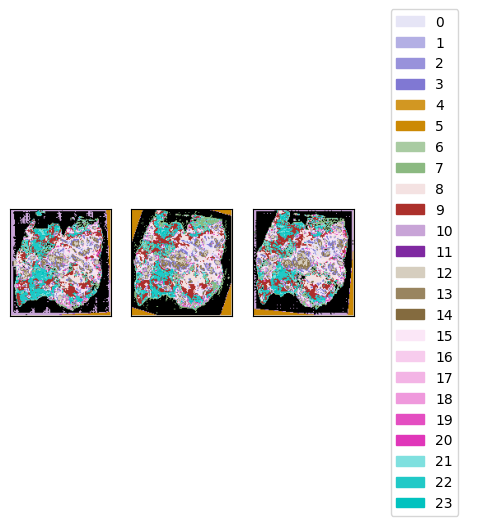

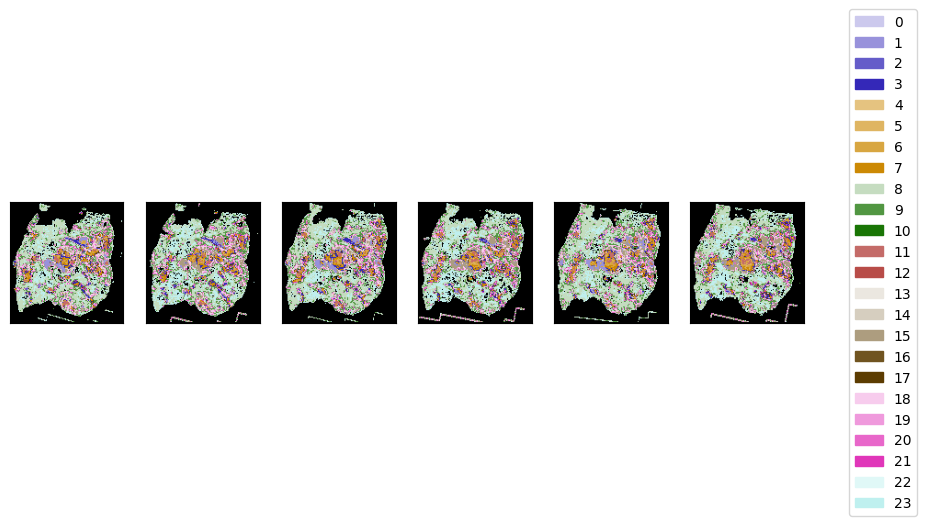

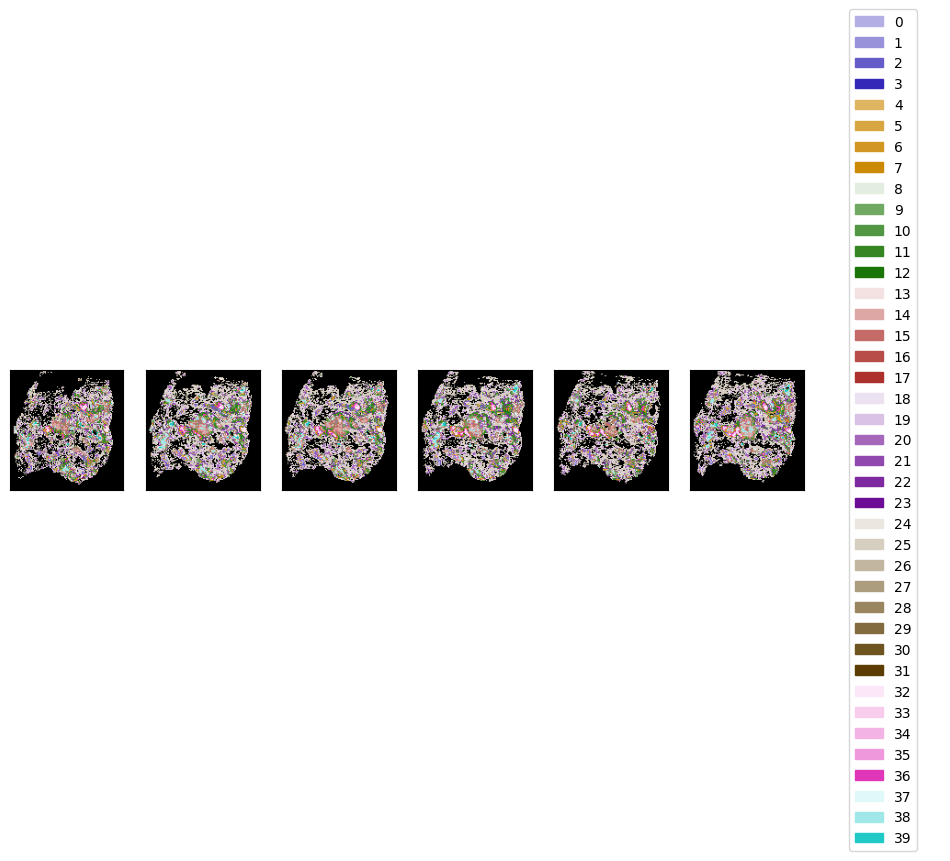

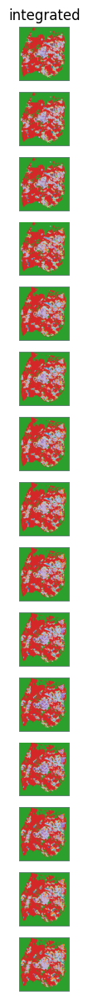

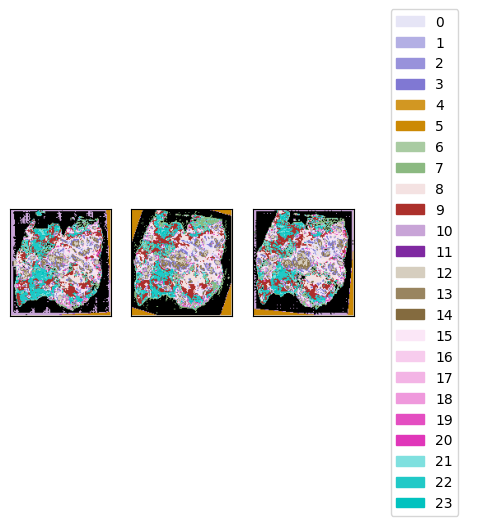

...

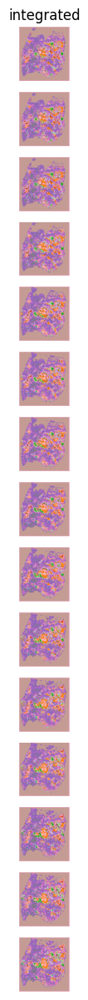

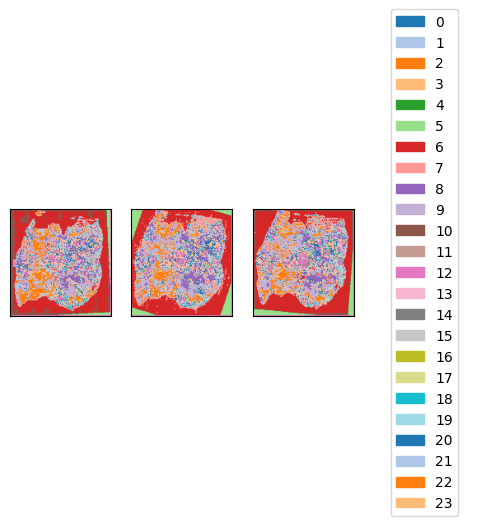

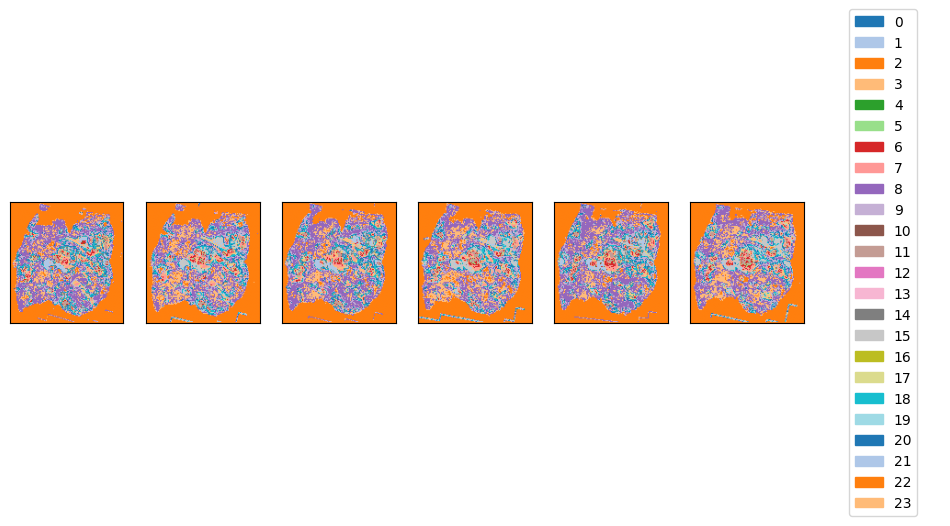

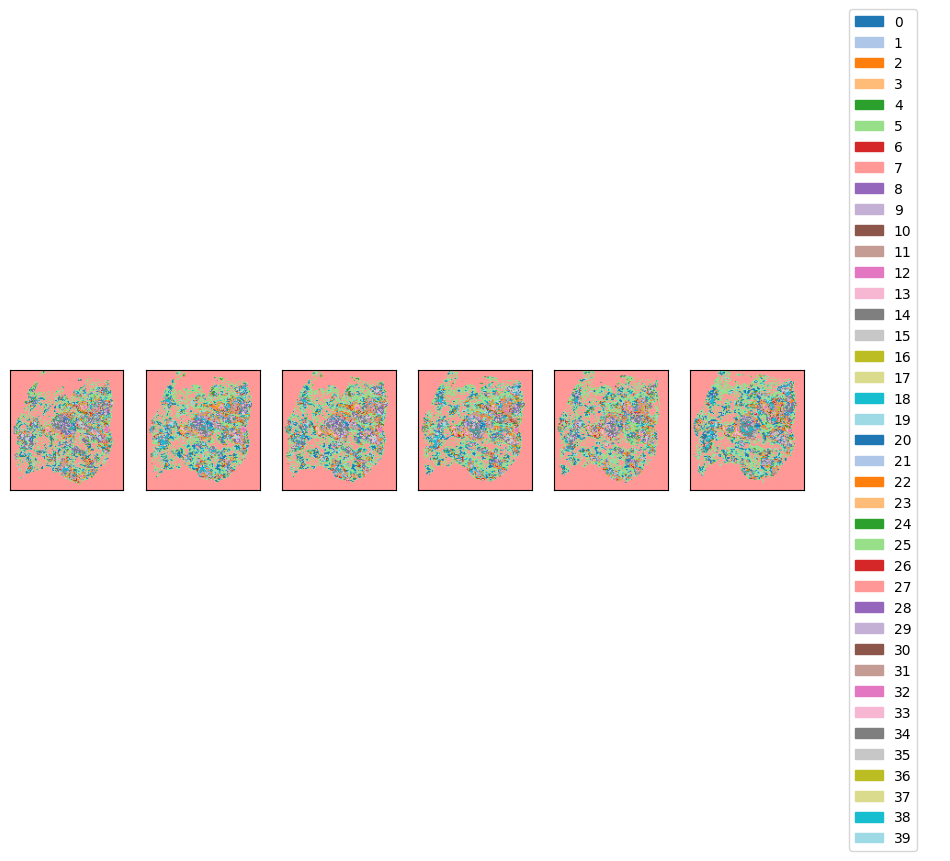

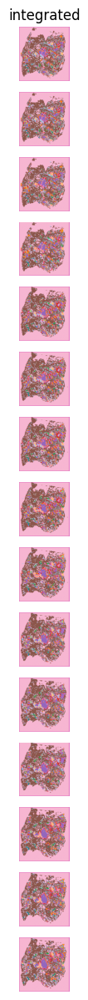

In [179]:
def save_nbhds(discard_max=False, use_hierarchy=True):
    for level in range(mushroom.num_levels):
        data = pickle.load(
            open(os.path.join(project_dir, case, 'mushroom_50res', f'nbhd_volumes_l{level}.pkl'), 'rb')
        )
        dtype_to_volume = data['probs']
        dtype_to_volume_labels = data['labeled']

        for dtype in mushroom.dtypes:
            mushroom.display_clusters(dtype, discard_max=discard_max, use_hierarchy=use_hierarchy)
            plt.savefig(os.path.join(fig_dir, f'nbhd_{dtype}_l{level}_bckrd{discard_max}_hcmap{use_hierarchy}.svg'), dpi=300)
            plt.savefig(os.path.join(fig_dir, f'nbhd_{dtype}_l{level}_bckrd{discard_max}_hcmap{use_hierarchy}.png'), dpi=300)

        mushroom.display_volumes(dtype_to_volume={k:v for k, v in dtype_to_volume_labels.items() if k=='integrated'},
                                 positions=mushroom.section_positions)

        plt.savefig(os.path.join(fig_dir, f'nbhd_integrated_l{level}_bckrd{discard_max}.svg'), dpi=300)
        plt.savefig(os.path.join(fig_dir, f'nbhd_integrated_l{level}_bckrd{discard_max}.png'), dpi=300)

fig_dir = os.path.join(out_dir, 'figures')
Path(fig_dir).mkdir(parents=True, exist_ok=True)

save_nbhds(discard_max=True, use_hierarchy=True)
save_nbhds(discard_max=True, use_hierarchy=False)
save_nbhds(discard_max=False, use_hierarchy=True)
save_nbhds(discard_max=False, use_hierarchy=False)


In [180]:
import shutil

In [181]:
fp = os.path.join(project_dir, case, 'mushroom_50res', f'outputs.pkl')
shutil.copy(fp, os.path.join(out_dir, 'outputs.pkl'))

'/data/estorrs/mushroom/data/projects/submission_v1/analysis/export/HT206B1/outputs.pkl'

In [46]:
fp = os.path.join(project_dir, case, 'mushroom_50res', f'outputs.pkl')
data = pickle.load(
    open(fp, 'rb')
)
data.keys()

dict_keys(['section_positions', 'section_ids', 'dtype_to_volume', 'dtype_to_volume_probs', 'dtype_to_clusters', 'dtype_to_cluster_probs', 'dtype_to_cluster_probs_all', 'dtype_to_cluster_intensities', 'dtype_to_cluster_to_agg'])

In [52]:
data['section_ids']

[('S18-9906-U1', 'visium'),
 ('S18-9906-U1', 'he'),
 ('S18-9906-U2', 'xenium'),
 ('S18-9906-U3', 'multiplex'),
 ('S18-9906-U5', 'batch2_he'),
 ('S18-9906-U9', 'xenium'),
 ('S18-9906-U10', 'multiplex'),
 ('S18-9906-U12', 'batch2_he'),
 ('S18-9906-U16', 'visium'),
 ('S18-9906-U16', 'he'),
 ('S18-9906-U17', 'xenium'),
 ('S18-9906-U18', 'multiplex'),
 ('S18-9906-U20', 'batch2_he'),
 ('S18-9906-U24', 'xenium'),
 ('S18-9906-U25', 'multiplex')]

In [53]:
data['dtype_to_clusters'].keys()

dict_keys(['integrated', 'batch2_he', 'he', 'multiplex', 'visium', 'xenium'])

In [55]:
# dtype to clusters is a dictionary mapping data types to nbhds for that data types sections for each nbhd level
# for instance here we get xenium nbhds, it is length 3 because there are 3 nbhd levels 
nbhd_sections = data['dtype_to_clusters']['xenium']
len(nbhd_sections)

3

In [57]:
# here we get the final level of neighborhoods
# there are 4 images as there are 4 xenium sections in case
nbhds = nbhd_sections[-1]
nbhds.shape, np.unique(nbhds)

((4, 172, 172),
 array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35]))

In [58]:
# grabbing second xenium section (U9, in this case)
img = nbhds[1]
img.shape

(172, 172)

... storing 'nbhd_xenium_level0' as categorical
... storing 'nbhd_integrated_level0' as categorical
... storing 'nbhd_multiplex_level0' as categorical
... storing 'nbhd_xenium_level1' as categorical
... storing 'nbhd_integrated_level1' as categorical
... storing 'nbhd_multiplex_level1' as categorical
... storing 'nbhd_xenium_level2' as categorical
... storing 'nbhd_integrated_level2' as categorical
... storing 'nbhd_multiplex_level2' as categorical


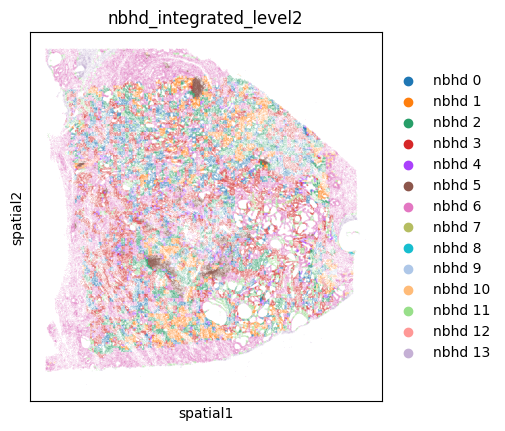

In [32]:
sc.pl.spatial(a, color='nbhd_integrated_level2', alpha_img=0)

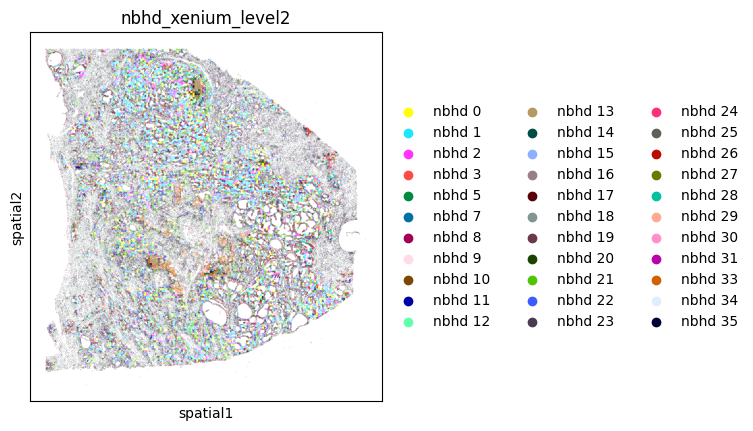

In [33]:
sc.pl.spatial(a, color='nbhd_xenium_level2', alpha_img=0)